
# Weather Forecast

This notebook is a demonstration for the first part of the ArdLabs Data Scientist Technical Task.

## Exploring the data, analyzing correlations and auto-correlations between different parameters and timesteps.

### Importing the dataset

In [1]:
# Importing the dataset
import pandas as pd
file_path = 'weather.tsv'
df = pd.read_csv(file_path, sep='\t')

In [2]:
# Checking the size
df.shape

(35059, 7)

In [3]:
df

,time,temperature,dew_point,wind_speed,wind_direction,visibility,clouds.total_cover
0,2019-01-01 00:00:00+00:00,7.0,3.0,1.54,120.0,5000.0,15
1,2019-01-01 01:00:00+00:00,8.0,3.0,1.54,120.0,9999.0,0
2,2019-01-01 02:00:00+00:00,8.0,3.0,1.54,120.0,9999.0,0
3,2019-01-01 04:00:00+00:00,8.0,2.0,2.57,150.0,9999.0,0
4,2019-01-01 05:00:00+00:00,8.0,2.0,3.60,130.0,9999.0,0
...,...,...,...,...,...,...,...
35054,2022-12-29 19:00:00+00:00,7.0,5.0,0.00,0.0,4000.0,15
35055,2022-12-29 20:00:00+00:00,8.0,5.0,1.03,110.0,4000.0,15
35056,2022-12-29 21:00:00+00:00,7.0,3.0,0.00,0.0,4000.0,15
35057,2022-12-29 22:00:00+00:00,6.0,4.0,6.17,360.0,5000.0,15


In [4]:
# Showing descriptive statistics
df.describe()

,temperature,dew_point,wind_speed,wind_direction,visibility,clouds.total_cover
count,34987.000000,34987.000000,35057.000000,34704.000000,35043.000000,35059.000000
mean,18.847143,7.207306,2.719773,177.619986,6030.509488,24.128041
std,8.371598,5.130714,2.424702,124.205833,1972.722544,20.199278
min,0.000000,-23.000000,0.000000,0.000000,0.000000,0.000000
25%,12.000000,4.000000,0.000000,0.000000,5000.000000,15.000000
50%,19.000000,7.000000,2.570000,240.000000,6000.000000,15.000000
75%,25.000000,11.000000,4.120000,280.000000,7000.000000,25.000000
max,42.000000,29.000000,46.300000,520.000000,9999.000000,100.000000


<ipython-input-5-2f2dfabba8fc>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


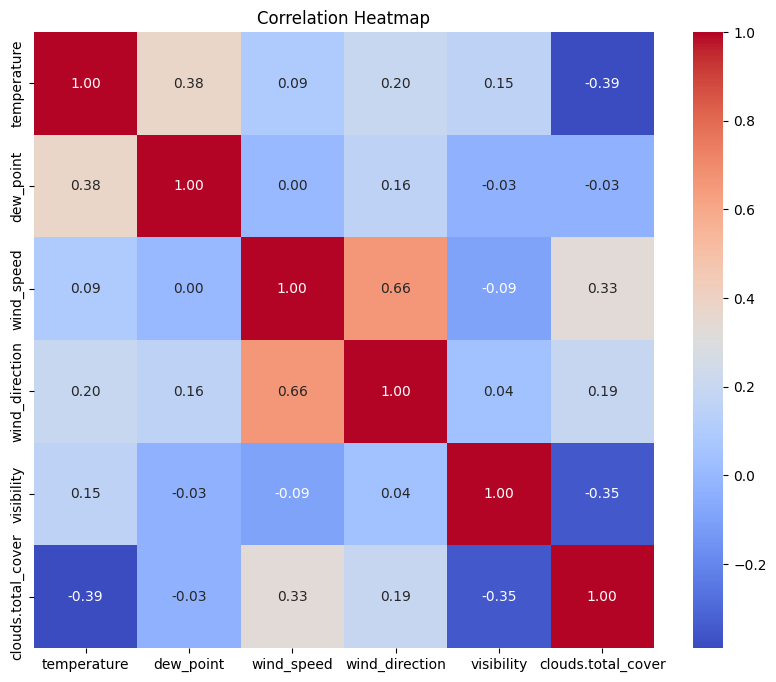

In [5]:
# Exploring correlations betweeen features
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
correlation_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()


### Cleansing and preprocessing the data

In [6]:
# Checking for duplicates
df.duplicated().sum()

0

In [7]:
# Checking the null count
df.isnull().sum()

time                    0
temperature            72
dew_point              72
wind_speed              2
wind_direction        355
visibility             16
clouds.total_cover      0
dtype: int64

It can be noticed that the null counts are relatively small.

355/ 35059 = 0.01 from the data

72/35059 = 0.002 from the data


### Initial descriptive visualizations

In [8]:
# Plotting the general weather among years

import plotly.graph_objects as go
import pandas as pd

features = ["time",	"temperature",	"dew_point",	"wind_speed",	"wind_direction",	"visibility",	"clouds.total_cover"]

for feature in features:

    fig = go.Figure()

    fig.add_trace(go.Scatter(x=df['time'], y=df[feature], mode='lines', name=feature))

    fig.update_layout(title=feature + ' Trends', xaxis_title='time', yaxis_title=feature)

    fig.show()


It can be noticed that the most clear seasonality appears in temperature and dew point plots.

In [9]:
# Plotting the temperature for months amongst years

import plotly.express as px
import pandas as pd

df['Year'] = pd.to_datetime(df['time']).dt.year
df['Month'] = pd.to_datetime(df['time']).dt.month

average_temp = df.groupby(['Year', 'Month'])['temperature'].mean().reset_index()

for year in average_temp['Year'].unique():
    year_data = average_temp[average_temp['Year'] == year]

    fig = px.line(year_data, x='Month', y='temperature')

    fig.update_layout(title=f'Average Air Temperature by Month - {year}',
                      xaxis_title='Month',
                      yaxis_title='Air Temperature (OC)')

    fig.show()


It can be noticed that the temperature is seasonal each year as well, as it starts in low temperatures in the first months then rises in the middle months then goes low in the last months.

In [10]:
# Plotting the temperature over time

import pandas as pd
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=df['time'], y=df['temperature'], name='Temperature'))
fig.update_layout(title='Temperature Over Time', xaxis_title='Date/Time', yaxis_title='Value')
fig.show()

In [11]:
# Plotting the distribution of temperature by month
df['Month'] = pd.to_datetime(df['time']).dt.month
fig = px.box(df, x='Month', y='temperature', title='Distribution of Temperature by Month')
fig.update_layout(xaxis_title='Month', yaxis_title='Temperature (OC)')
fig.show()

As the temperature shows very clear seasonality, it will be used alone with tome for a simple model to forecast temperature in different timings of days.

In [12]:
# Making time column in date time format
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import ccf

df['time'] = pd.to_datetime(df['time'])
df

,time,temperature,dew_point,wind_speed,wind_direction,visibility,clouds.total_cover,Year,Month
0,2019-01-01 00:00:00+00:00,7.0,3.0,1.54,120.0,5000.0,15,2019,1
1,2019-01-01 01:00:00+00:00,8.0,3.0,1.54,120.0,9999.0,0,2019,1
2,2019-01-01 02:00:00+00:00,8.0,3.0,1.54,120.0,9999.0,0,2019,1
3,2019-01-01 04:00:00+00:00,8.0,2.0,2.57,150.0,9999.0,0,2019,1
4,2019-01-01 05:00:00+00:00,8.0,2.0,3.60,130.0,9999.0,0,2019,1
...,...,...,...,...,...,...,...,...,...
35054,2022-12-29 19:00:00+00:00,7.0,5.0,0.00,0.0,4000.0,15,2022,12
35055,2022-12-29 20:00:00+00:00,8.0,5.0,1.03,110.0,4000.0,15,2022,12
35056,2022-12-29 21:00:00+00:00,7.0,3.0,0.00,0.0,4000.0,15,2022,12
35057,2022-12-29 22:00:00+00:00,6.0,4.0,6.17,360.0,5000.0,15,2022,12


In [13]:
df = df.drop("Year", axis=1)
df = df.drop("Month", axis=1)

In [14]:
df1 = df.dropna()

<Figure size 1200x400 with 0 Axes>

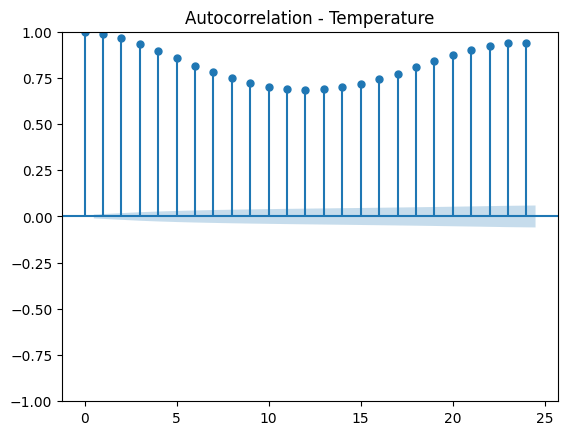

In [15]:
# Measuring the autocorrelation between hourly points and them after a day - 24 hrs
plt.figure(figsize=(12, 4))
plot_acf(df1['temperature'], lags=24, title='Autocorrelation - Temperature')
plt.show()

The autocorrelation shows a strong relationship between the temperature at a certain time and it after 23 - 24 hours.

## Building a forecast model to predict the hourly temperature of one day ahead.

There can be an input of multiple hours (days) before the forecast.

In [16]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import keras
import tensorflow as tf
from keras.preprocessing.sequence import TimeseriesGenerator

In [17]:
# Only keeping "time" and "temperature" columns
df['time'] = pd.to_datetime(df['time'])
df.set_axis(df['time'], inplace=True)
df.drop(columns=['dew_point','wind_speed','wind_direction', 'visibility', 'clouds.total_cover'], inplace=True)
df

<ipython-input-17-ac3b6223ee2f>:3: FutureWarning:

DataFrame.set_axis 'inplace' keyword is deprecated and will be removed in a future version. Use `obj = obj.set_axis(..., copy=False)` instead



,time,temperature
time,,
2019-01-01 00:00:00+00:00,2019-01-01 00:00:00+00:00,7.0
2019-01-01 01:00:00+00:00,2019-01-01 01:00:00+00:00,8.0
2019-01-01 02:00:00+00:00,2019-01-01 02:00:00+00:00,8.0
2019-01-01 04:00:00+00:00,2019-01-01 04:00:00+00:00,8.0
2019-01-01 05:00:00+00:00,2019-01-01 05:00:00+00:00,8.0
...,...,...
2022-12-29 19:00:00+00:00,2022-12-29 19:00:00+00:00,7.0
2022-12-29 20:00:00+00:00,2022-12-29 20:00:00+00:00,8.0
2022-12-29 21:00:00+00:00,2022-12-29 21:00:00+00:00,7.0


In [18]:
df = df.dropna()

In [19]:
df.shape

(34987, 2)

In [20]:
# Splitting data to 80% train and 20% test
temp_data = df['temperature'].values
temp_data = temp_data.reshape((-1,1))

split_percent = 0.80
split = int(split_percent*len(temp_data))

temp_train = temp_data[:split]
temp_test = temp_data[split:]

date_train = df['time'][:split]
date_test = df['time'][split:]

print(len(temp_train))
print(len(temp_test))

27989
6998


In [21]:
look_back = 24 #24 hours

train_generator = TimeseriesGenerator(temp_train, temp_train, length=look_back, batch_size=20)
test_generator = TimeseriesGenerator(temp_test, temp_test, length=look_back, batch_size=1)

In [22]:
# Defining an LSTM model to use
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam

model1 = Sequential()
model1.add(InputLayer((24, 1)))
model1.add(LSTM(64))
model1.add(Dense(8, 'relu'))
model1.add(Dense(1, 'linear'))

model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 64)                16896     
                                                                 
 dense (Dense)               (None, 8)                 520       
                                                                 
 dense_1 (Dense)             (None, 1)                 9         
                                                                 
Total params: 17425 (68.07 KB)
Trainable params: 17425 (68.07 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Long Short-Term Memory (LSTM) networks, a type of recurrent neural network (RNN), excel in time series forecasting due to their adeptness at handling sequential data, capturing long-term dependencies, and incorporating memory cells for adapting to changing patterns. That's why they were used.

In [23]:
model1.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.0001), metrics=[RootMeanSquaredError()])

num_epochs = 10

model1.fit_generator(train_generator, epochs=num_epochs, verbose=1)

<ipython-input-23-65484c979d00>:5: UserWarning:

`Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.



Epoch 1/10
1399/1399 [==============================] - 16s 5ms/step - loss: 140.5256 - root_mean_squared_error: 11.8544
Epoch 2/10
1399/1399 [==============================] - 8s 5ms/step - loss: 6.6740 - root_mean_squared_error: 2.5834
Epoch 3/10
1399/1399 [==============================] - 7s 5ms/step - loss: 2.0334 - root_mean_squared_error: 1.4260
Epoch 4/10
1399/1399 [==============================] - 8s 5ms/step - loss: 1.3280 - root_mean_squared_error: 1.1524
Epoch 5/10
1399/1399 [==============================] - 8s 6ms/step - loss: 1.1081 - root_mean_squared_error: 1.0527
Epoch 6/10
1399/1399 [==============================] - 7s 5ms/step - loss: 1.0080 - root_mean_squared_error: 1.0040
Epoch 7/10
1399/1399 [==============================] - 7s 5ms/step - loss: 0.9689 - root_mean_squared_error: 0.9843
Epoch 8/10
1399/1399 [==============================] - 8s 6ms/step - loss: 0.9423 - root_mean_squared_error: 0.9707
Epoch 9/10
1399/1399 [==============================] - 8s 5

In [24]:
# Plotting the predictions with real data

import plotly.graph_objs as go

prediction = model1.predict_generator(test_generator)

temp_train = temp_train.reshape((-1))
temp_test = temp_test.reshape((-1))
prediction = prediction.reshape((-1))

trace1 = go.Scatter(
    x = date_train,
    y = temp_train,
    mode = 'lines',
    name = 'Data'
)
trace2 = go.Scatter(
    x = date_test,
    y = prediction,
    mode = 'lines',
    name = 'Prediction'
)
trace3 = go.Scatter(
    x = date_test,
    y = temp_test,
    mode='lines',
    name = 'Ground Truth'
)
layout = go.Layout(
    title = "Temperatures",
    xaxis = {'title' : "Date"},
    yaxis = {'title' : "Temperature"}
)
fig = go.Figure(data=[trace1, trace2, trace3], layout=layout)
fig.show()

<ipython-input-24-1959cf3a325a>:5: UserWarning:

`Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.



In [25]:
# Calculating evaluation metrics

from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

temp_train = temp_train[-len(date_train) + look_back:]
temp_test = temp_test[look_back:]
prediction = prediction.reshape((-1))

mse = mean_squared_error(temp_test, prediction)

rmse = np.sqrt(mse)

r2 = r2_score(temp_test, prediction)

print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R^2): {r2:.2f}")


Mean Squared Error (MSE): 0.87
Root Mean Squared Error (RMSE): 0.93
R-squared (R^2): 0.98


- MSE of 0.87 indicates that, on average, the model's predictions have a squared difference of 0.87 from the actual values. A lower MSE suggests that the model's predictions are closer to the actual values.

- With an RMSE of 0.93, the model's predictions have an average error of approximately 0.93 in the same units as the data. Smaller RMSE values imply that the LSTM model's predictions are relatively close to the actual values.

- An R-squared value of 0.98 signifies that 98% of the variance in the actual values is explained by the LSTM model. A higher R-squared value indicates that the model fits the data very well, explaining most of the variability in the dependent variable.



##  Creating and documenting a forecast function that implements the solution.

In [26]:
temp_data = temp_data.reshape((-1))

# Defining a predict function that makes a sequence of predictions for temperatures,
# where each new prediction is based on the previous look_back data points and gradually extends the forecasted sequence
def predict(num_prediction, model):
    prediction_list = temp_data[-look_back:]

    for _ in range(num_prediction):
        x = prediction_list[-look_back:]
        x = x.reshape((1, look_back, 1))
        out = model1.predict(x)[0][0]
        prediction_list = np.append(prediction_list, out)
    prediction_list = prediction_list[look_back-1:]

    return prediction_list

# Defining a function that  generates a list of datetime values for future predictions
def predict_dates(num_prediction):
    last_date = df['time'].values[-1]
    prediction_dates = pd.date_range(last_date, periods=num_prediction+1, freq='H').tolist()
    return prediction_dates

In [27]:
import pandas as pd
import plotly.graph_objs as go

# Defining a function to forecast and plot
def forecast(num_prediction, model):

    predictions = predict(num_prediction, model)
    prediction_dates = predict_dates(num_prediction)

    forecast_df = pd.DataFrame({'Date': prediction_dates, 'Prediction': predictions})

    print(forecast_df)

    trace1 = go.Scatter(
        x=forecast_df['Date'],
        y=forecast_df['Prediction'],
        mode='lines',
        name='Prediction'
    )
    layout = go.Layout(
        title='Temperature Forecast',
        xaxis={'title': 'Date'},
        yaxis={'title': 'Temperature'}
    )
    fig = go.Figure(data=[trace1], layout=layout)
    fig.show()

In [28]:
# Example usage
num_predictions = 24  # Number of predictions to make
forecast(num_predictions, model1)

1/1 [==============================] - 0s 22ms/step
                  Date  Prediction
0  2022-12-29 23:00:00    6.000000
1  2022-12-30 00:00:00    5.817682
2  2022-12-30 01:00:00    5.710654
3  2022-12-30 02:00:00    5.662123
4  2022-12-30 03:00:00    5.725965
5  2022-12-30 04:00:00    5.954625
6  2022-12-30 05:00:00    6.370811
7  2022-12-30 06:00:00    6.982708
8  2022-12-30 07:00:00    7.782394
9  2022-12-30 08:00:00    8.702563
10 2022-12-30 09:00:00    9.652558
11 2022-12-30 10:00:00   10.525530
12 2022-12-30 11:00:00   11.212685
13 2022-12-30 12:00:00   11.627045
14 2022-12-30 13:00:00   11.740821
15 2022-12-30 14:00:00   11.550737
16 2022-12-30 15:00:00   11.156165
17 2022-12-30 16:00:00   10.660876
18 2022-12-30 17:00:00   10.142773
19 2022-12-30 18:00:00    9.644695
20 2022-12-30 19:00:00    9.180628
21 2022-12-30 20:00:00    8.751159
22 2022-12-30 21:00:00    8.355558
23 2022-12-30 22:00:00    7.996846
24 2022-12-30 23:00:00    7.681356


In [29]:
!pip freeze > requirements.txt

## References

I was highly inspired from the below resources, as this is my first time in forecasting features based on time series data:

- https://towardsdatascience.com/time-series-forecasting-with-recurrent-neural-networks-74674e289816#:~:text=Predicting%20the%20future%20is%20easy,output%20day%20after%20tomorrow's%20value.

- https://www.youtube.com/watch?v=c0k-YLQGKjY